# Pipeline for BIAPT lab EEG Preprocessing: 
#### inspired by: https://github.com/hoechenberger/pybrain_mne/
#### adapted by: Beatrice PDK, Victoria Sus and Charlotte Maschke, 
#### This pipeline uses MNE Python to preprocess EEG data: Plese go here: 
####                                https://mne.tools/stable/overview/index.html
####  for more documentation on MNE Python

## Setup and import

In [1]:
import matplotlib
#import mne_bids
import pathlib
import mne
import os
import os.path as op
from mne import viz

# interactive plotting functions.


from mne.preprocessing import (ICA, create_eog_epochs, create_ecg_epochs,
                               corrmap)
#import openneuro

#from mne_bids import BIDSPath, read_raw_bids, print_dir_tree, make_report

# Ensure Matplotlib uses the Qt5Agg backend, 
# which is the best choice for MNE-Python's 
# interactive plotting functions.
matplotlib.use('Qt5Agg')

import matplotlib.pyplot as plt

### Enter the recording information you want preprocess

In [2]:
ID = "009"
session = "07"
task = "post7"

In [3]:
raw_path = "./Data/coma_tacs/sub-{}/ses-{}/eeg/sub-{}_ses-{}_task-{}_eeg.mff".format(ID,session,ID,session,task)
raw_path

'./Data/coma_tacs/sub-009/ses-07/eeg/sub-009_ses-07_task-post7_eeg.mff'

## Load the raw data!

In [4]:
raw = mne.io.read_raw_egi(raw_path)
raw

Reading EGI MFF Header from /home/bea/Bureau/BIAPT/EEG_Preprocessing_TACS/Data/coma_tacs/sub-009/ses-07/eeg/sub-009_ses-07_task-post7_eeg.mff...
    Reading events ...
    Assembling measurement info ...


<RawMff | signal1.bin, 129 x 330965 (331.0 s), ~180 kB, data not loaded>

## Resample the data to 250

In [5]:
if raw.info['sfreq'] != 250:
    raw = raw.resample(250)

### Keep the EEG only

In [6]:
# this is to load EEG. If you want to load other stuff please refer to the website documentation
eeg = raw.pick_types(eeg = True)
print('Number of channels in EEG:')
len(eeg.ch_names)

Number of channels in EEG:


129

## Apply filtering

In [7]:
# load actual data into system (before it was only metadata)
eeg.load_data()
#eeg.load_data()

# filter the data between 1 to 55 Hz
eeg_filtered = eeg.filter(l_freq=1, h_freq = 55)# we needed to lower the low_pass to 50 because of the presence of a weird machine artifact
#eeg_filtered = eeg.filter(l_freq=1, h_freq = 55) 

# notch filter the data for freq =60
eeg_notch = eeg_filtered.copy().notch_filter(freqs= 60)
#eeg_notch = eeg_filtered.notch_filter(freqs=60)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 55 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 55.00 Hz
- Upper transition bandwidth: 13.75 Hz (-6 dB cutoff frequency: 61.88 Hz)
- Filter length: 825 samples (3.300 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 1651 samples (6.604 sec)



[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.5s finished


In [8]:
%matplotlib qt
viz.plot_raw_psd(eeg_notch, exclude = ['VREF'], fmax = 70)
if not os.path.exists('./out_figures2/coma_tacs/sub-{}/ses-{}/task-{}'.format(ID,session,task)) :
    os.makedirs('./out_figures2/coma_tacs/sub-{}/ses-{}/task-{}'.format(ID,session,task))
plt.savefig('./out_figures2/coma_tacs/sub-{}/ses-{}/task-{}/sub-{}_ses-{}_task-{}_PSD_raw_filtered.png'.format(ID,session,task,ID,session,task))

Effective window size : 8.192 (s)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished


## Crop the data

Depending on the data, we may need to crop the begining or/and the end

Using matplotlib as 2D backend.


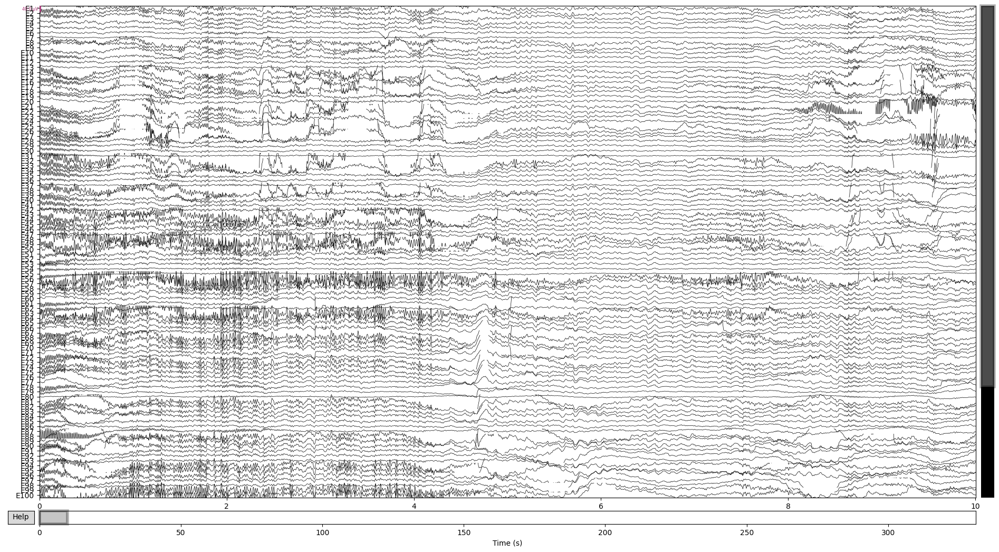

In [9]:
eeg_notch.plot(duration=10, n_channels=100, title='raw')

Select if begining and end should be cropped and adapt next line accordingly

In [10]:
eeg_cropped= eeg_notch.crop(tmin=1.0,tmax=329.0)

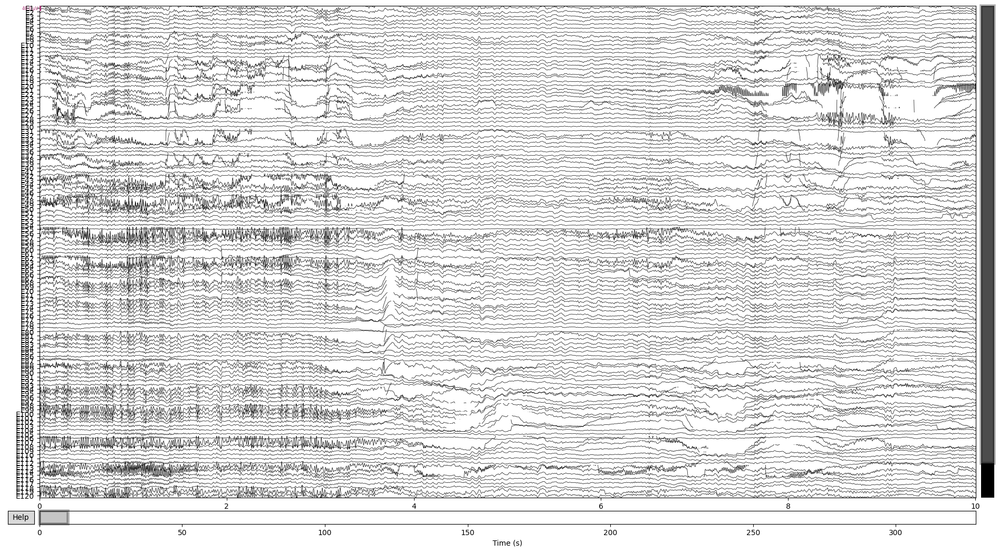

Channels marked as bad:
none
Channels marked as bad:
none


In [11]:
eeg_cropped.plot(duration=10, n_channels=120,title='cropped')

## Visualize raw data to identify bad channels

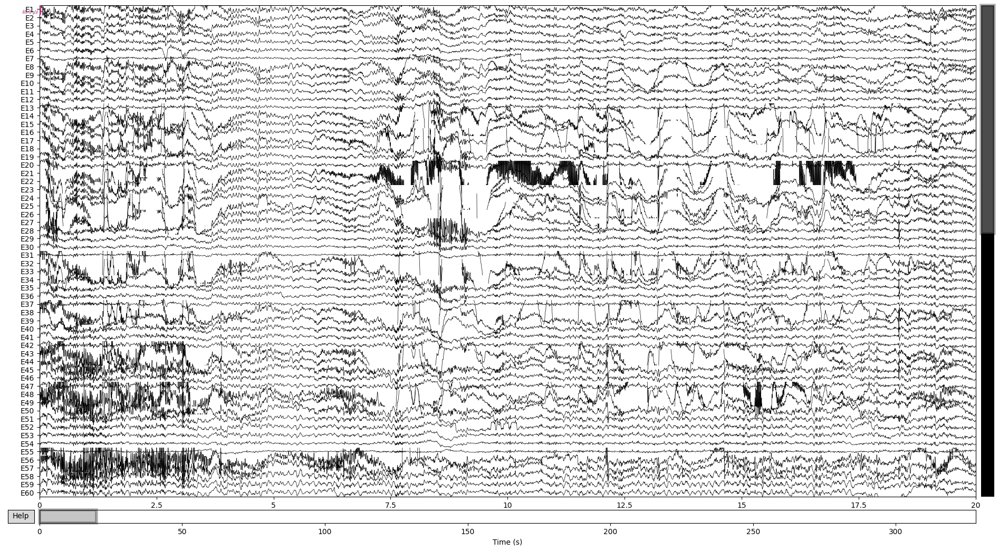

Channels marked as bad:
['E17', 'E128', 'E127', 'E114', 'E113', 'E107', 'E32', 'E56']


In [12]:
eeg_cropped.plot(n_channels=60, duration=20)

Verify if labelled correctly

In [13]:
marked_bad = eeg_cropped.info['bads']
marked_bad

['E17', 'E128', 'E127', 'E114', 'E113', 'E107', 'E32', 'E56']

In [ ]:
#eeg_cropped.plot(n_channels =30, duration=20)

In [14]:
# save in a txt
if not os.path.exists('./eeg_output/coma_tacs/sub-{}/ses-{}/eeg'.format(ID,session)) :
    os.makedirs('./eeg_output/coma_tacs/sub-{}/ses-{}/eeg'.format(ID,session))
with open('./eeg_output/coma_tacs/sub-{}/ses-{}/eeg/sub-{}_ses-{}_task-{}_marked_bads.json'.format(ID,session,ID,session,task), 'w') as outfile:
    outfile.write("\n".join(marked_bad))


## Remove bad channels

In [15]:
eeg_cropped_removed = eeg_cropped.copy().drop_channels(eeg_cropped.info['bads'])

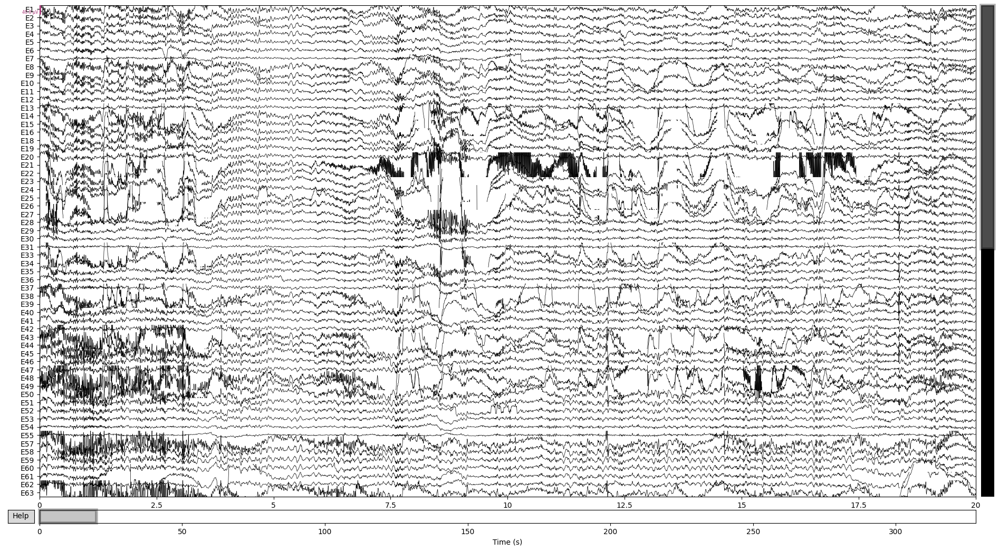

In [16]:
eeg_cropped_removed.plot(n_channels =60, duration=20)

In [ ]:
#eeg_cropped_removed.copy().drop_channels(eeg_cropped_removed.info['bads'])

## Segment into 10-sec epochs

In [17]:
epochs = mne.make_fixed_length_epochs(eeg_cropped_removed, duration = 10, overlap=0)

Not setting metadata
32 matching events found
No baseline correction applied
0 projection items activated


In [18]:
epochs  #verify initial number

Number of events,32
Events,1: 32
Time range,0.000 – 9.996 sec
Baseline,off


### Reject epochs with amplitude bigger than 2000 µVolt 

Peak to peak amplitude on brain scalp > 2000 µVolt are epochs not linked with physiological causes, physiological amplitude accepted < 800 µVolt

Using data from preloaded Raw for 32 events and 2500 original time points ...
0 bad epochs dropped
    Rejecting  epoch based on EEG : ['E25', 'E26']
    Rejecting  epoch based on EEG : ['E25']
    Rejecting  epoch based on EEG : ['E21']
    Rejecting  epoch based on EEG : ['E25', 'E26']
    Rejecting  epoch based on EEG : ['E14', 'E15', 'E21', 'E25', 'E26']
5 bad epochs dropped


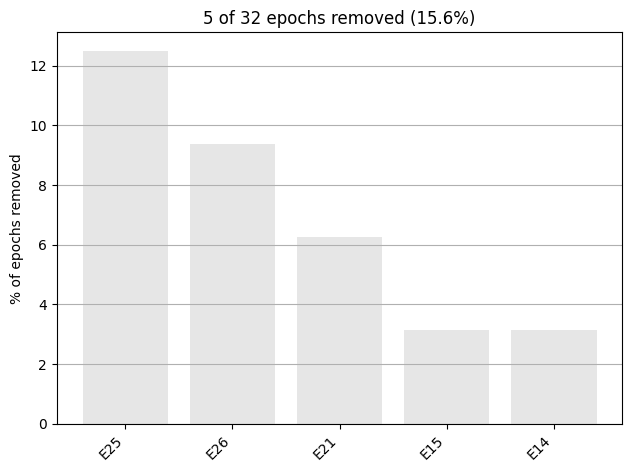

In [19]:
epochs_clean = epochs.copy().load_data()
epochs_clean.drop_bad({'eeg':2000*1e-6})
epochs_clean.plot_drop_log()

In [ ]:
#epochs_clean = epochs # if automatized innapropriate (removes too much)

In [20]:
epochs_clean

Number of events,27
Events,1: 27
Time range,0.000 – 9.996 sec
Baseline,off


Remove epochs of bad quality remaining

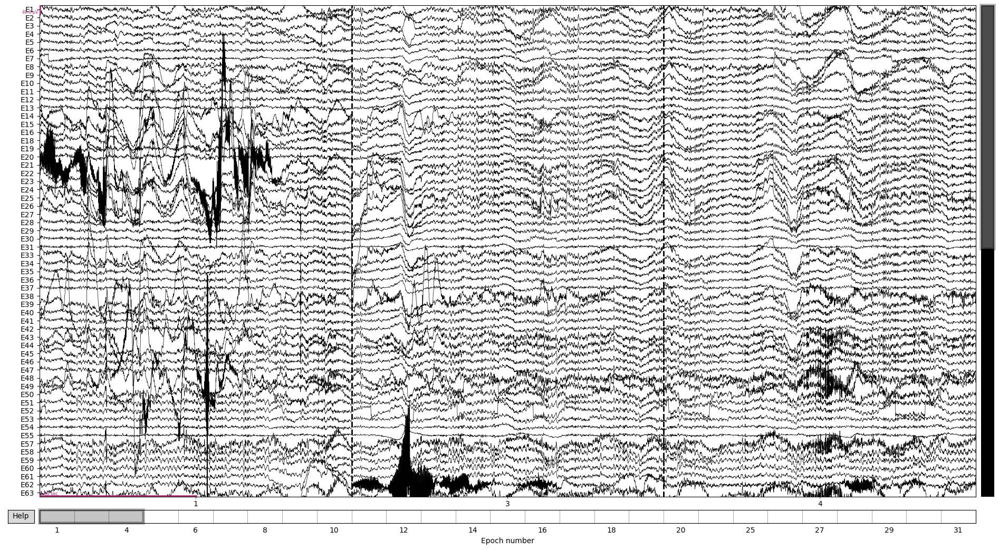

Dropped 6 epochs: 0, 3, 4, 8, 18, 20
The following epochs were marked as bad and are dropped:
[1, 5, 6, 10, 20, 25]
Channels marked as bad:
['E21', 'E38', 'E48', 'E22', 'E14', 'E15', 'E62', 'E83', 'E121', 'E108', 'E109', 'E81', 'E126', 'E87', 'E94', 'E92']


In [25]:
epochs_clean.plot(title='bad_epochs_remaining', n_epochs=3, n_channels=60, scalings=20e-6)

In [26]:
epochs_clean

Number of events,21
Events,1: 21
Time range,0.000 – 9.996 sec
Baseline,off


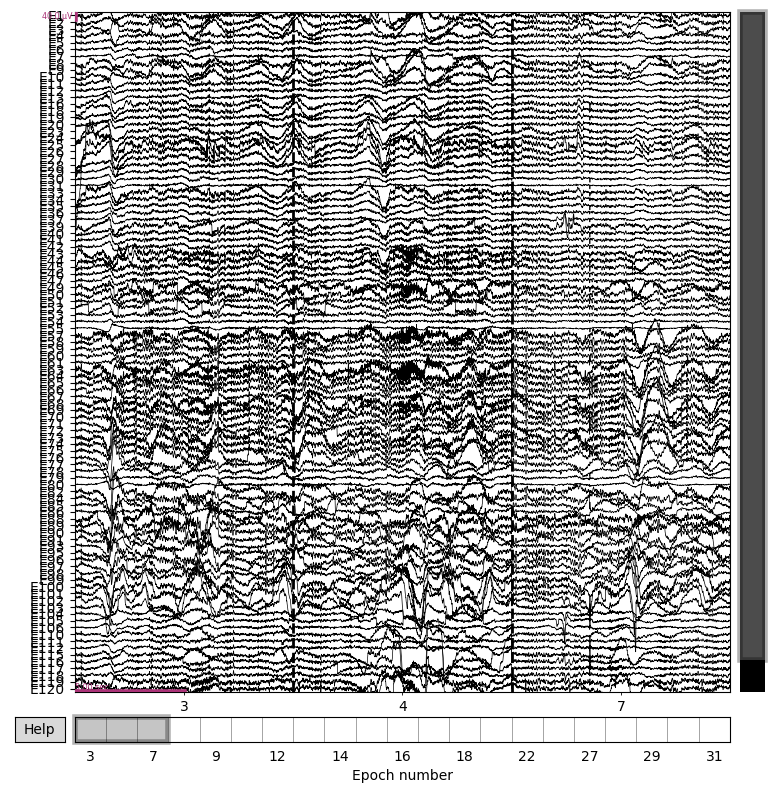

Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
['E21', 'E38', 'E48', 'E22', 'E14', 'E15', 'E62', 'E83', 'E121', 'E108', 'E109', 'E81', 'E126', 'E87', 'E94', 'E92']


In [27]:
epochs_clean.plot(n_epochs=3, n_channels=100, scalings=20e-6)

In [ ]:
#eeg_cropped_removed = eeg_cropped.copy().drop_channels(eeg_cropped.info['bads'])

    Using multitaper spectrum estimation with 7 DPSS windows


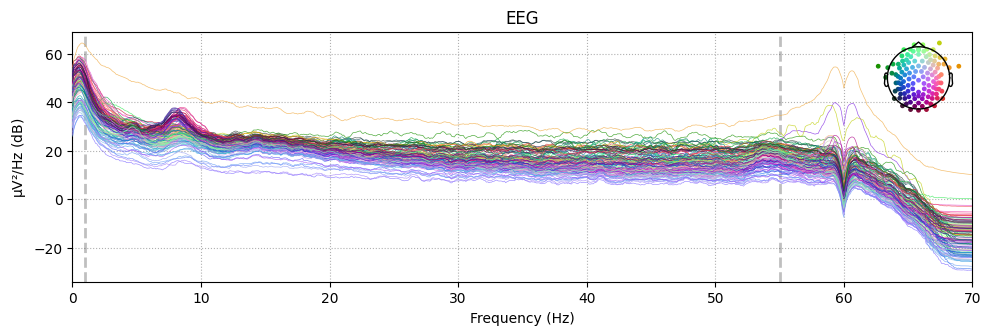

In [28]:
%matplotlib qt
epochs_clean.plot_psd(fmax=70, exclude = ['VREF'])
#if not os.path.exists('./out_figures2/coma_tacs/sub-{}/ses-{}/task-{}'.format(ID,session,task)) :
#    os.makedirs('./out_figures2/coma_tacs/sub-{}/ses-{}/task-{}'.format(ID,session,task))
#plt.savefig('./out_figures2/coma_tacs/sub-{}/ses-{}/task-{}/sub-{}_ses-{}_task-{}_PSD_epochs_filtered.png'.format(ID,session,task,ID,session,task))

## Drop additionnal channels afterwards if necessarry

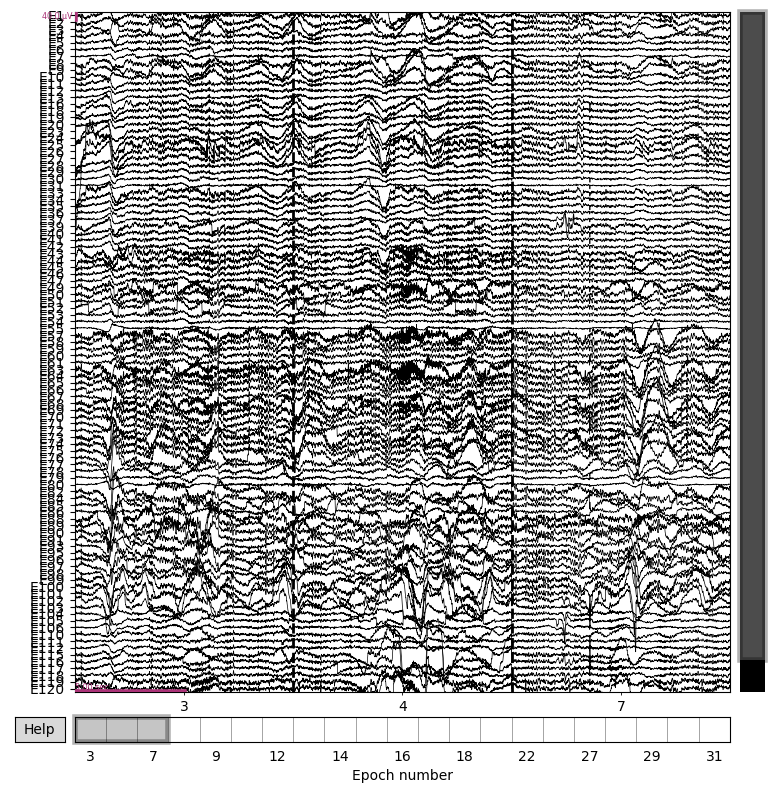

Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
['E21', 'E38', 'E48', 'E22', 'E14', 'E15', 'E62', 'E83', 'E121', 'E108', 'E109', 'E81', 'E126', 'E87', 'E94', 'E92']


In [29]:
#Select bad channels on the plot
epochs_clean.plot(n_epochs=3, n_channels=100, scalings=20e-6)

In [30]:
epochs_clean.info['bads']

['E21',
 'E38',
 'E48',
 'E22',
 'E14',
 'E15',
 'E62',
 'E83',
 'E121',
 'E108',
 'E109',
 'E81',
 'E126',
 'E87',
 'E94',
 'E92']

In [31]:
epochs_clean = epochs_clean.copy().drop_channels(epochs_clean.info['bads'])

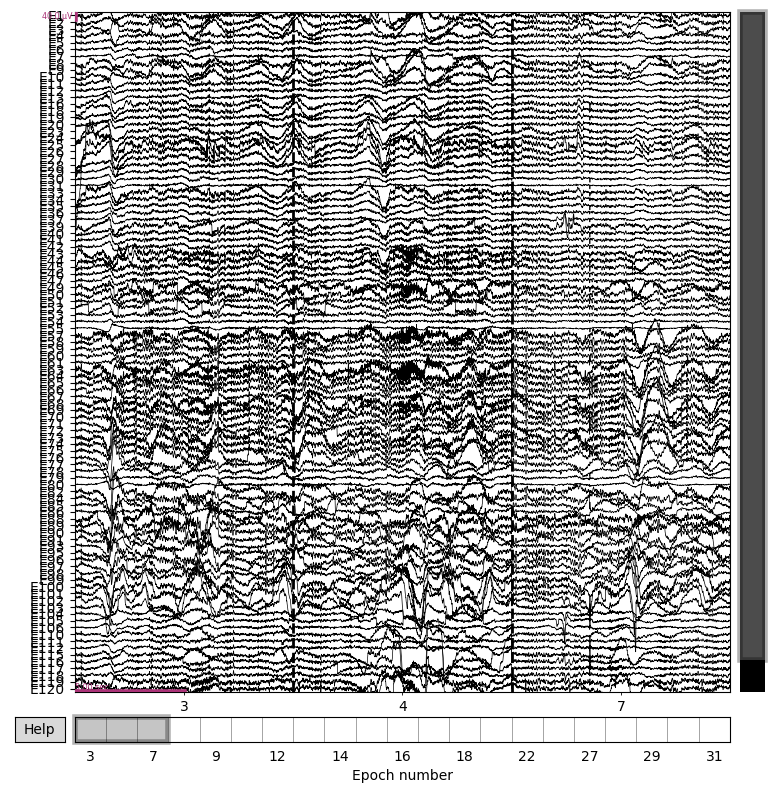

In [32]:
epochs_clean.plot(n_epochs=3, n_channels=100, scalings=20e-6)

In [33]:
epochs_clean

Number of events,21
Events,1: 21
Time range,0.000 – 9.996 sec
Baseline,off


# RUN ICA

## Manual selection of ICA components

Number of components = 30 because it's better to have as many components as possible (up to the nb of electrodes ~100 after clearing and rejection of non brain)
30 remains a good compromise

In [34]:
from mne.preprocessing import (ICA, create_eog_epochs, create_ecg_epochs,
                               corrmap)

ica = ICA(n_components=30, max_iter='auto', random_state=97)
ica.fit(epochs_clean)

Fitting ICA to data using 105 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 8.6s.


Method,fastica
Fit,57 iterations on epochs (52500 samples)
ICA components,30
Explained variance,94.9 %
Available PCA components,105
Channel types,eeg
ICA components marked for exclusion,—


Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated


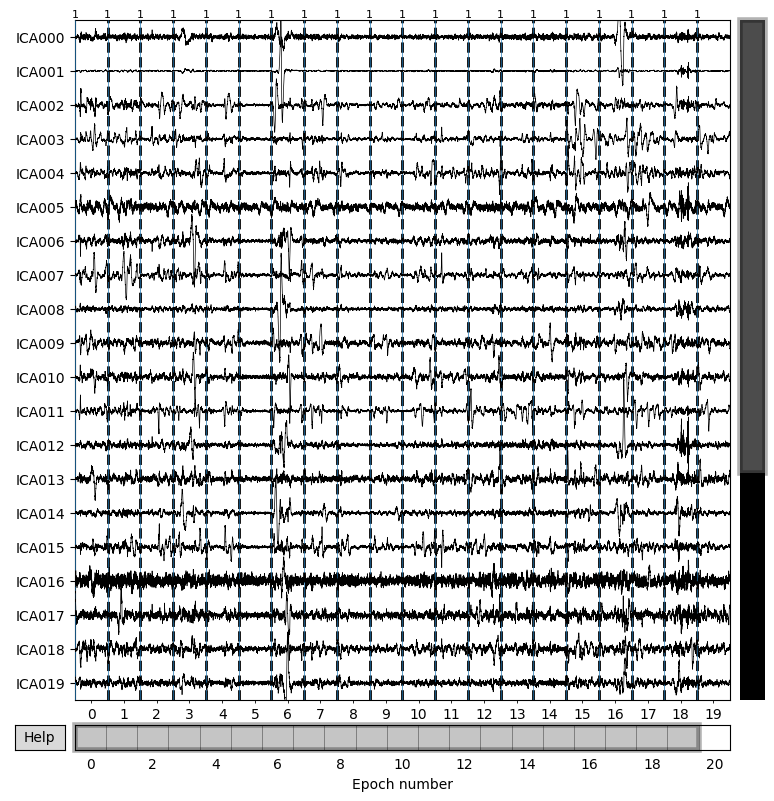

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
21 matching events found
No baseline correction applied
0 projection items activate

In [35]:
ica.plot_sources(epochs_clean)

In [ ]:
ica.plot_components(inst=epochs_clean)

Main artifacts, eyes and jaw muscle contractions and clear non physiological artifacts (machine at the ICU for example). Coordinates in the variance table, x corresponds to epochs, y corresponds to variance. Enables to identify if the component has an impact on the variance all recording long or rather if it is a specific epoch that we need to reject. we need to decide if it is a component to remove or rather an epoch. 

In [ ]:
ica.plot_properties(epochs_clean, picks=ica.exclude)

In [36]:
ica

Method,fastica
Fit,57 iterations on epochs (52500 samples)
ICA components,30
Explained variance,94.9 %
Available PCA components,105
Channel types,eeg
ICA components marked for exclusion,ICA016ICA005ICA002ICA007ICA015ICA029ICA020ICA011


Double check which component to remove: 

In [37]:
ica.exclude

[16, 5, 2, 7, 15, 29, 20, 11]

In [38]:
len(ica.exclude)

8

## Remove component definetely

In [39]:
epochs_clean.load_data()
eeg_postica= ica.apply(epochs_clean.copy())


Applying ICA to Epochs instance
    Transforming to ICA space (30 components)
    Zeroing out 8 ICA components
    Projecting back using 105 PCA components


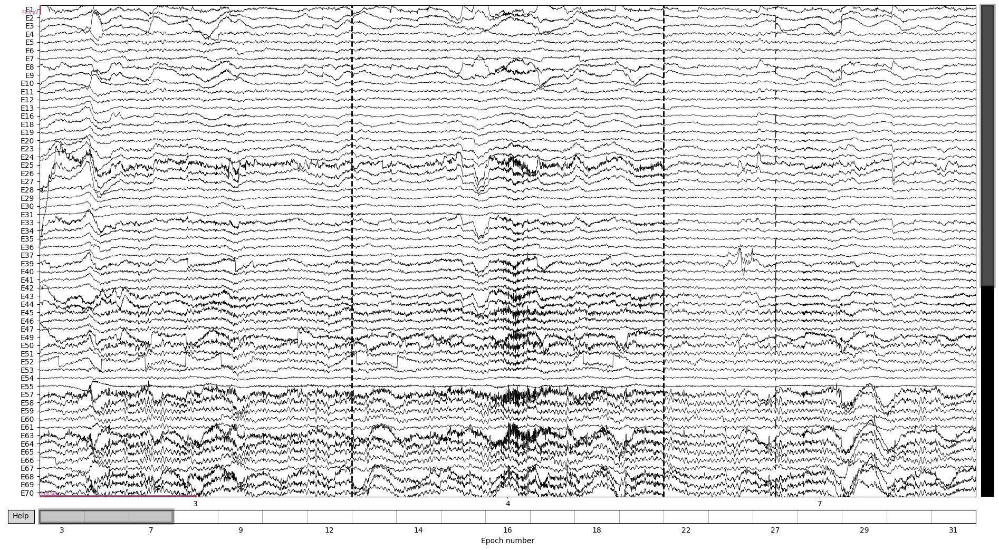

Dropped 5 epochs: 3, 6, 15, 16, 18
The following epochs were marked as bad and are dropped:
[8, 12, 26, 27, 29]
Channels marked as bad:
['E88', 'E102', 'E101', 'E57', 'E63', 'E97']
Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
none


In [40]:
# PLot to compare both signals pre and post ICA
epochs_clean.plot(title='raw', n_epochs=3, n_channels=60, scalings=20e-6)
eeg_postica.plot(title='ICA correction', n_epochs=3, n_channels=60, scalings=20e-6)

Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
none
    Using multitaper spectrum estimation with 7 DPSS windows


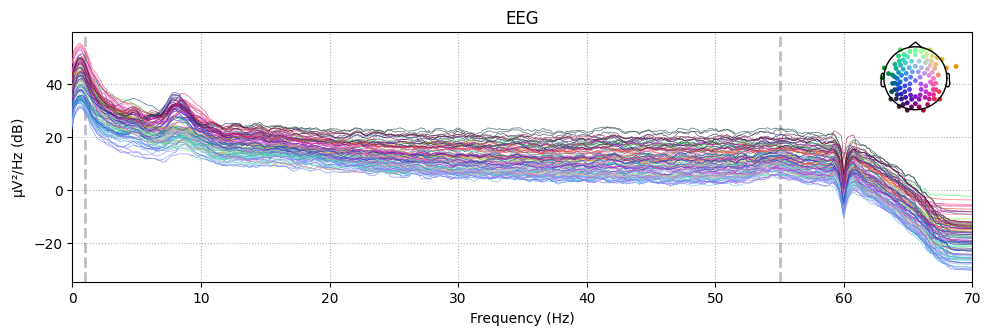

In [41]:
%matplotlib qt
eeg_postica.plot_psd(exclude = ['VREF'], fmax = 70)
#if not os.path.exists('./out_figures2/coma_tacs/sub-{}/ses-{}/task-{}'.format(ID,session,task)) :
#    os.makedirs('./out_figures2/coma_tacs/sub-{}/ses-{}/task-{}'.format(ID,session,task))
#plt.savefig('./out_figures2/coma_tacs/sub-{}/ses-{}/task-{}/sub-{}_ses-{}_task-{}_PSD_epochs_post_ica.png'.format(ID,session,task,ID,session,task))

In [42]:
eeg_postica = eeg_postica.copy().drop_channels(eeg_postica.info['bads'])

## Average Reference the data

In [43]:
# use the average of all channels as reference
eeg_avg_ref = eeg_postica.set_eeg_reference(ref_channels='average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


In [ ]:
#eeg_avg_ref.plot(title='Avg ref', n_epochs=3, n_channels=100, scalings=20e-6)

    Using multitaper spectrum estimation with 7 DPSS windows


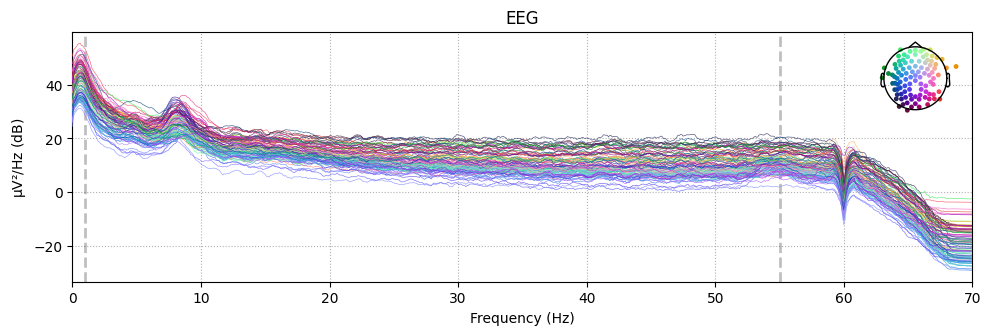

In [44]:
%matplotlib tk
eeg_avg_ref.plot_psd(fmax=70)
#if not os.path.exists('./out_figures2/coma_tacs/sub-{}/ses-{}/task-{}'.format(ID,session,task)) :
#    os.makedirs('./out_figures2/coma_tacs/sub-{}/ses-{}/task-{}'.format(ID,session,task))
#plt.savefig('./out_figures2/coma_tacs/sub-{}/ses-{}/task-{}/sub-{}_ses-{}_task-{}_PSD_avg_ref.png'.format(ID,session,task,ID,session,task))

## Remove Non-Brain Electrodes 

In [45]:
non_brain_el = ['E127', 'E126', 'E17', 'E21', 'E14', 'E25', 'E8', 'E128', 'E125', 'E43', 'E120', 'E48', 
                'E119', 'E49', 'E113', 'E81', 'E73', 'E88', 'E68', 'E94', 'E63', 'E99', 'E56', 'E107' ]

#only add non-brain channels if not already part of noisy channels
for e in non_brain_el: 
    if e in eeg_avg_ref.info['ch_names']:
        if e not in marked_bad :
            eeg_avg_ref.info['bads'].append(e)
    


In [46]:
print(eeg_avg_ref.info['bads'])

['E25', 'E8', 'E125', 'E43', 'E120', 'E119', 'E49', 'E73', 'E68', 'E99']


In [47]:
# remove non-brain channels
eeg_brainonly = eeg_avg_ref.copy().drop_channels(eeg_avg_ref.info['bads'])

## Verify removal

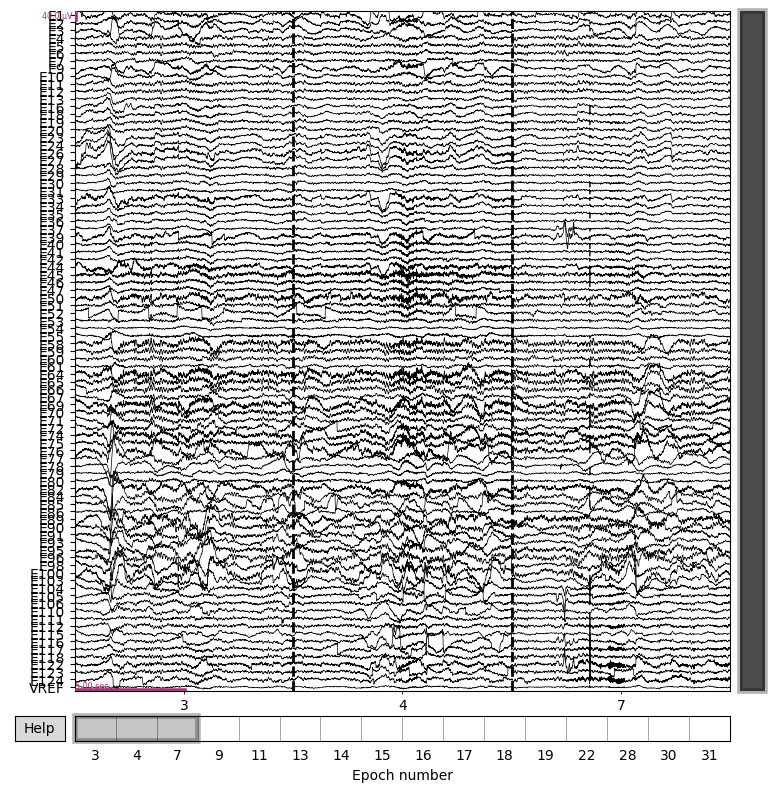

Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
['E100', 'E82', 'E50', 'E76', 'E89']


In [52]:
eeg_brainonly.plot(title='brain only', n_epochs=3, n_channels=100, scalings=20e-6)

In [53]:
eeg_brainonly= eeg_brainonly.copy().drop_channels(eeg_brainonly.info['bads'])

In [50]:
eeg_brainonly


Number of events,16
Events,1: 16
Time range,0.000 – 9.996 sec
Baseline,off


Verify psd

In [54]:
%matplotlib qt
eeg_brainonly.plot_psd(fmax=70)
plt.savefig('./out_figures2/coma_tacs/sub-{}/ses-{}/task-{}/sub-{}_ses-{}_task-{}_PSD_brainonly.png'.format(ID,session,task,ID,session,task))

    Using multitaper spectrum estimation with 7 DPSS windows


## Save final non brain data

In [55]:
eeg_brainonly.save("./eeg_output/coma_tacs/sub-{}/ses-{}/eeg/sub-{}_ses-{}_task-{}_{}_eeg.fif".format(ID, session, ID, session, task, 'epoch'), overwrite=True)
#ici changer pour le sauver dans derivatives, dossier clean (avec un readme expliquant le cleaning) et le fichier sous le bids format

/tmp/ipykernel_26177/2224581532.py:1: RuntimeWarning: This filename (./eeg_output/coma_tacs/sub-009/ses-07/eeg/sub-009_ses-07_task-post7_epoch_eeg.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  eeg_brainonly.save("./eeg_output/coma_tacs/sub-{}/ses-{}/eeg/sub-{}_ses-{}_task-{}_{}_eeg.fif".format(ID, session, ID, session, task, 'epoch'), overwrite=True)
